# "MIT 18.S191 Computational Thinking: Introduction to Images"

>

- toc: true
- branch: master
- keywords: computational-thinking
- comments: true
- author: Anderson Banihirwe
- categories: ["2020", "MIT 18.S191", "todayilearned", "python", "skimage"]


> Note: This notebook is adapted from [MIT 18.S191 Introduction to Computational Thinking course (Fall 2020)](https://computationalthinking.mit.edu/Fall20/). The course uses [Julia](https://julialang.org/) Programming language, and I thought it would be fun to follow along while using Python :).

> Note: Check out the lecture video on YouTube


> youtube: https://youtu.be/DGojI9xcCfg


## What is an image, though?

- A grid of colored squares called **pixels**
- A color of each pair (i, j) of indices
- A **discretization**


## How can we store an image in the computer?

- A 1D array --> `vector`
- A 2D array --> `matrix`
- A 3D array --> `tensor`


## Load image using scikit-image (`skimage`) package


In [1]:
import skimage.io
import numpy as np
import warnings

warnings.filterwarnings("ignore")

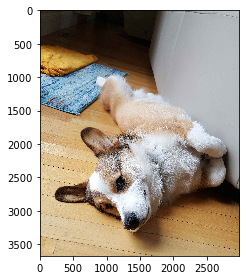

In [2]:
url = "https://i.imgur.com/VGPeJ6s.jpg"
philip = skimage.io.imread(url)
skimage.io.imshow(philip)

In [3]:
type(philip)

numpy.ndarray

In [4]:
philip.dtype

dtype('uint8')

In [5]:
philip.shape

(3675, 2988, 3)

## Slicing and Indexing


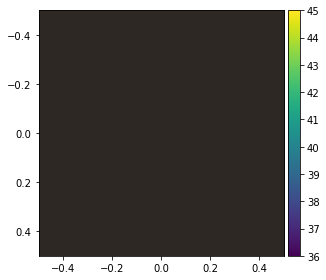

In [6]:
# Show the 100th and 400th pixels
skimage.io.imshow(philip[100:101, 400:401, :])

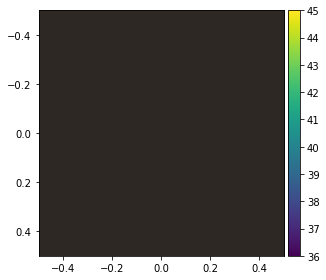

In [7]:
skimage.io.imshow(philip[100, 400].reshape(1, 1, 3))

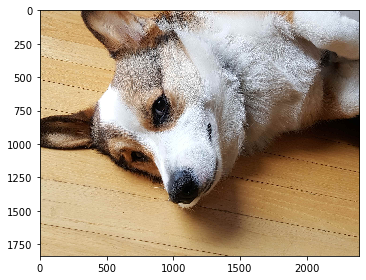

In [8]:
h, w, _ = philip.shape
# Extract bottom half of the image
# and a tenth of the width until nine tenth of the width into the image
head = philip[(h // 2) : h, (w // 10) : ((9 * w) // 10)]
skimage.io.imshow(head)

In [9]:
head.shape

(1838, 2391, 3)

In [10]:
philip.shape

(3675, 2988, 3)

## Manipulating matrices

An image is just a matrix, so we can manipulate _matrices_ to manipulate the
image:


In [11]:
stacked_philip = np.hstack([head, head])
stacked_philip.shape

(1838, 4782, 3)

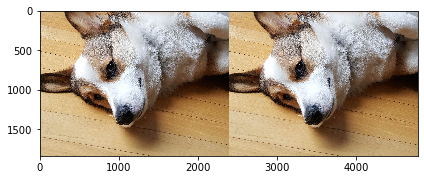

In [12]:
skimage.io.imshow(stacked_philip)

In [13]:
a = np.hstack([head, np.flip(head, axis=1)])
b = np.hstack([np.flip(head, axis=0), np.flip(np.flip(head, axis=1), axis=0)])
c = np.vstack([a, b])
a.shape, b.shape, c.shape

((1838, 4782, 3), (1838, 4782, 3), (3676, 4782, 3))

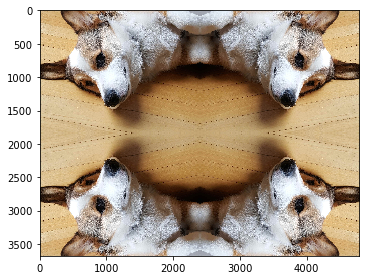

In [14]:
skimage.io.imshow(c)

## Manipulating an image


- How can we get inside the image and change it?
- There are two possibilities:
  - **Modify** or **mutate** numbers inside the array. This is useful when we
    want to change a small piece
  - Create a new **copy** of the array. This is useful when we want to alter
    everything together


## Painting a piece of an image

- Let's paint a corner red
- We'll copy the image first so we don't destroy the original


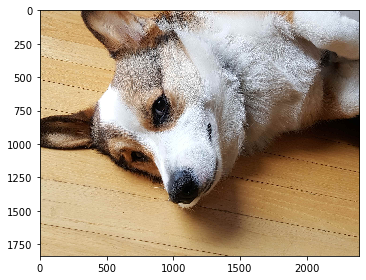

In [15]:
new_phil = head.copy()
skimage.io.imshow(new_phil)

### Using `for` loops


In [16]:
%%timeit
for i in range(1, 100):
    for j in range(1, 300):
        new_phil[i, j] = [255, 0, 0] # Paint this corner red


42 ms ± 301 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


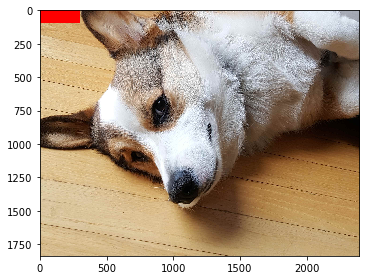

In [17]:
skimage.io.imshow(new_phil)

### Using element-wise operations via broadcasting

Instead of using `for` loops, it is better and more efficient to let `NumPy` do
the broadcasting for us during arithmetic operations.

See
[NumPy broadcasting documentation](https://numpy.org/doc/stable/user/basics.broadcasting.html)
for detailed explanation


In [18]:
new_phil2 = new_phil.copy()

In [19]:
%%timeit
new_phil2[100:200, 1:100] = [0, 255, 0] # Paint this corner green

52.1 µs ± 727 ns per loop (mean ± std. dev. of 7 runs, 10000 loops each)


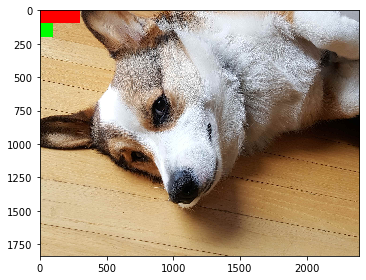

In [20]:
skimage.io.imshow(new_phil2)

## Modifying the whole image at once

- We can use the same broadcasting trick to modify the whole image at once
- Let's **redify** the image


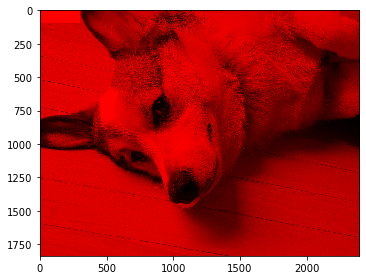

In [21]:
def redify(image):
    """Function that turns a color into just its red component"""
    img = image.copy()
    img[:, :, 1:] = 0
    return img


skimage.io.imshow(redify(new_phil))

## Transforming an image

- Let's decimate (downsample) philip original image


In [22]:
def decimate(img, r):
    """Pull every other `r` element in the array"""
    return img[0::r, 0::r]

In [23]:
poor_phil = decimate(philip, 5)
poor_phil.shape

(735, 598, 3)

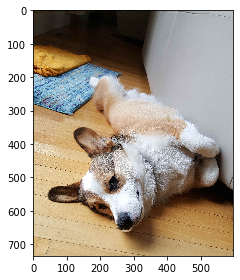

In [24]:
skimage.io.imshow(poor_phil)

### Blurring


In [25]:
import skimage.filters
import matplotlib.pyplot as plt
import panel as pn

In [26]:
# Apply Gaussian blur, creating a new image
def blur(image, sigma):
    blurred_phil = skimage.filters.gaussian(
        image, sigma=(sigma, sigma), multichannel=True
    )
    return blurred_phil


# Create a widget for exploring different sigma values
sigma = pn.widgets.Player(
    name="Sigma", start=1, end=30, value=1, loop_policy="once"
)


@pn.depends(sigma)
def viewer(sigma):
    img = blur(image=head, sigma=sigma)
    ax = skimage.io.imshow(img)
    plt.title(f"Sigma={sigma}")
    fig = ax.get_figure()
    plt.close(fig)
    return fig


p = pn.Column("<br>\n# Image Viewer\n**Select sigma value**", sigma, viewer)
p.save("apps/blur_explorer.html", embed=True)

 72%|███████▏  | 21/29 [01:16<00:21,  2.70s/it]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 86%|████████▌ | 25/29 [01:25<00:09,  2.45s/it]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 93%|█████████▎| 27/29 [01:30<00:04,  2.27s/it]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



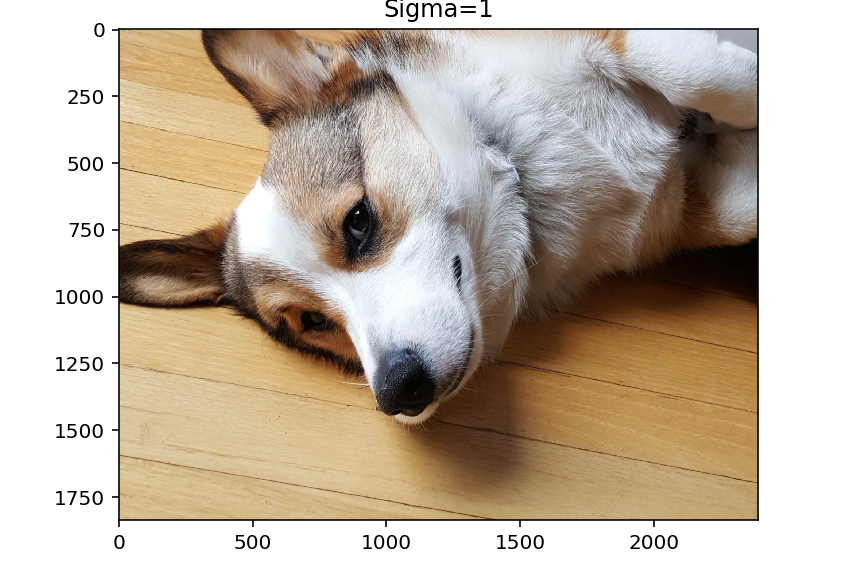
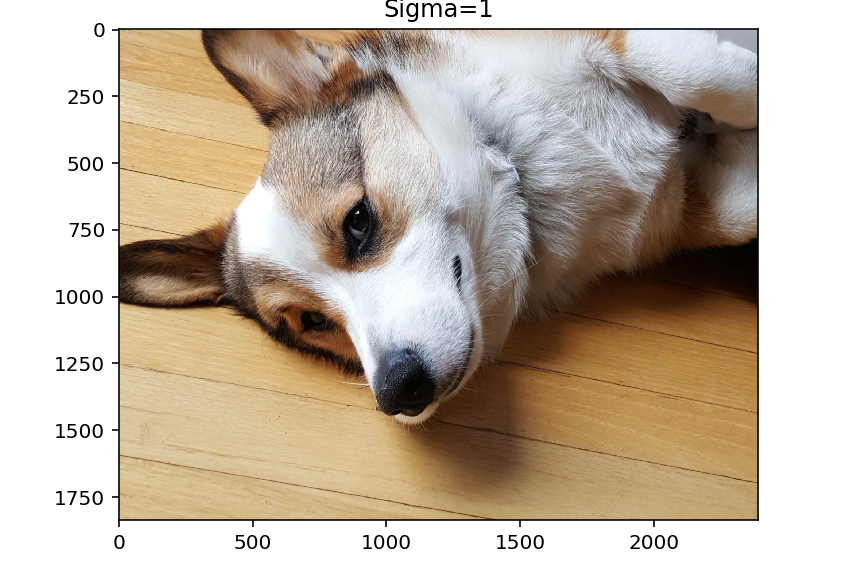
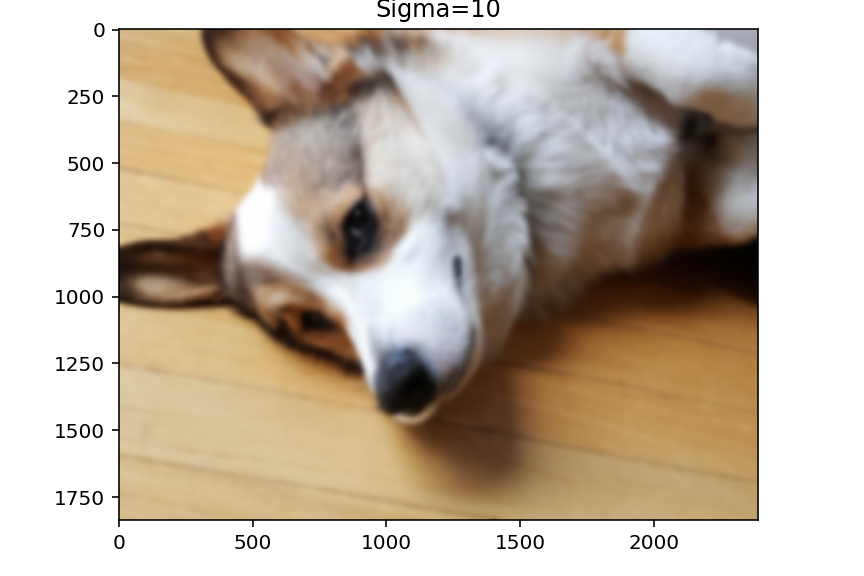
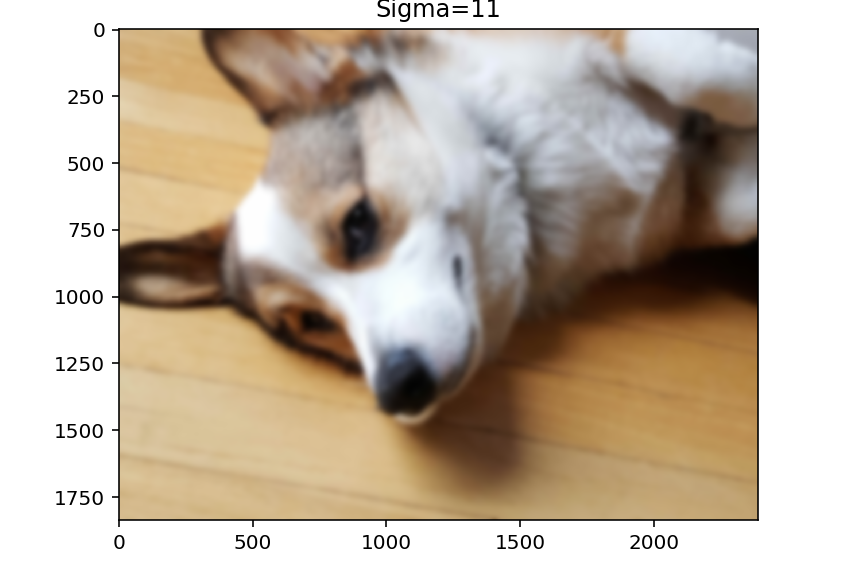
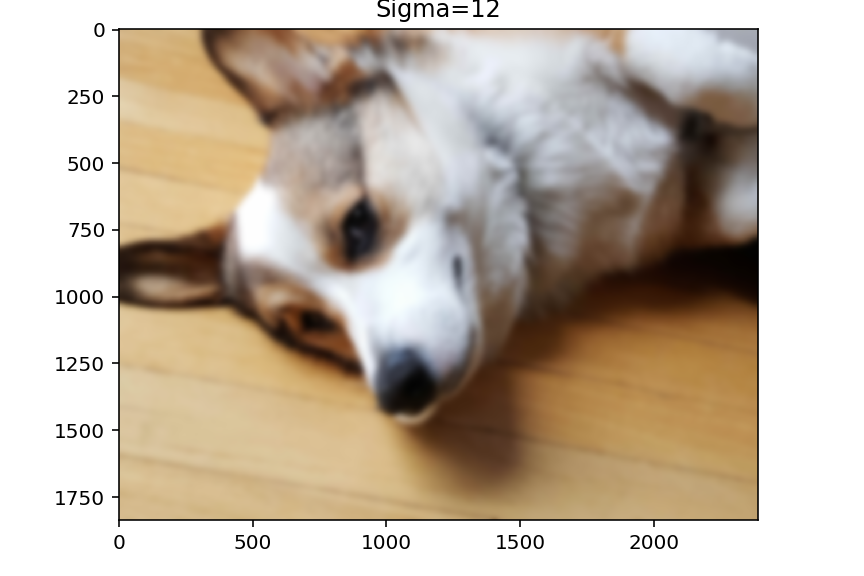
...
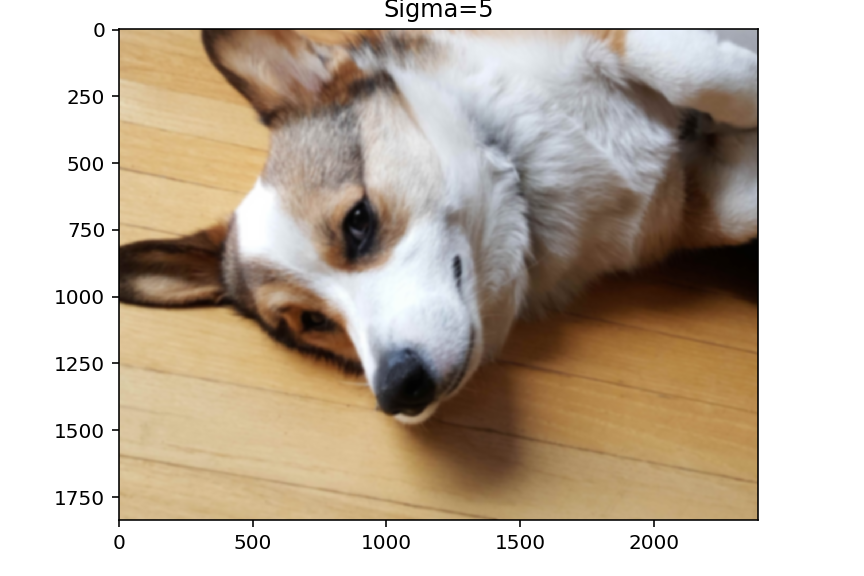
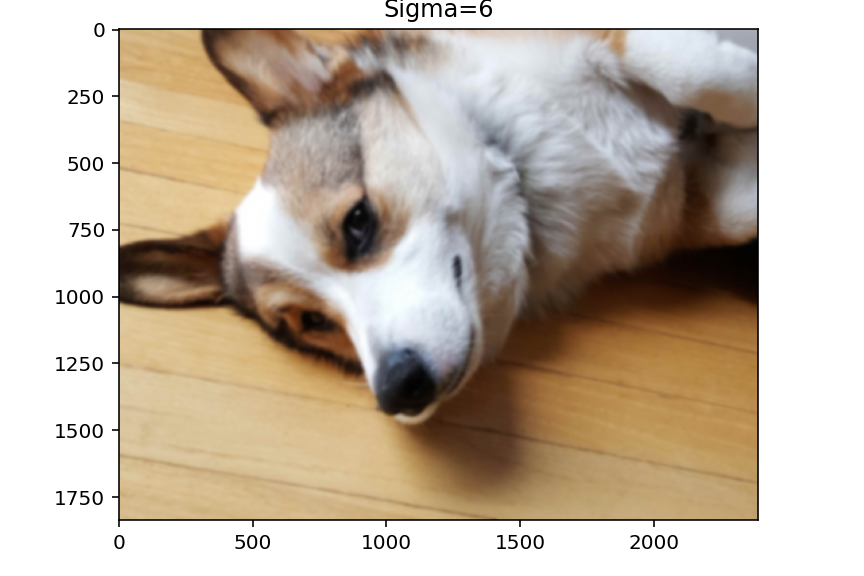
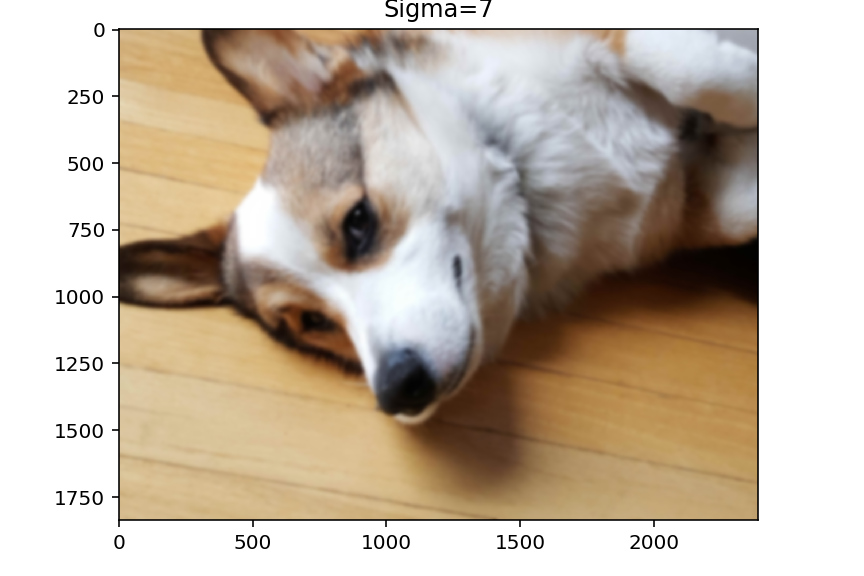
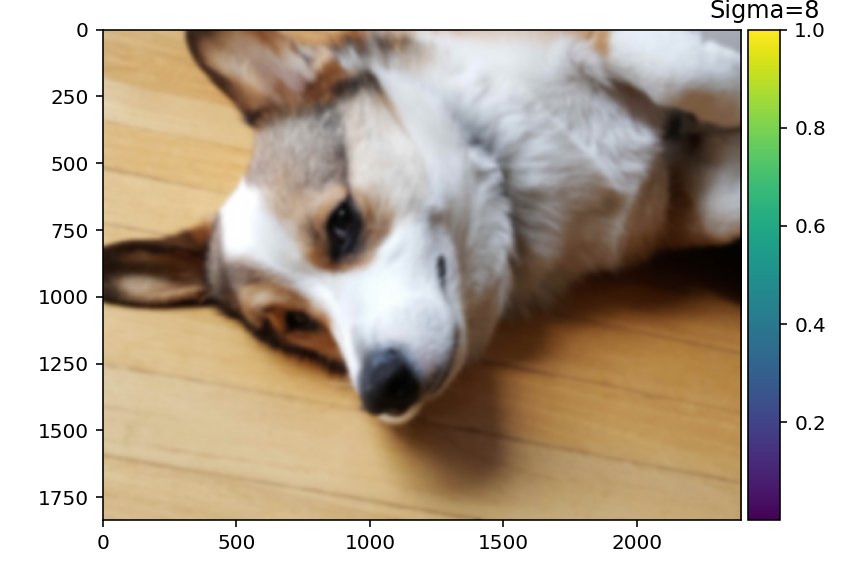
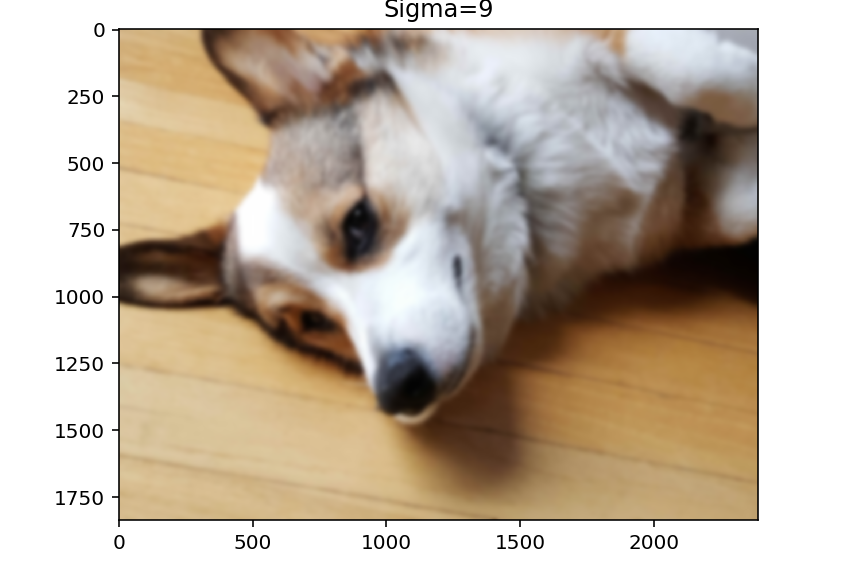

In [27]:
from IPython.display import HTML, display, display_html

display(HTML("apps/blur_explorer.html"))

<p></p>
<p></p>
<p></p>
<p></p>
<p></p>
<p></p>


In [28]:
%load_ext watermark
%watermark -d -iv -m -g

skimage 0.17.2
panel   0.9.7
numpy   1.19.1
2020-09-12 

compiler   : Clang 10.0.1 
system     : Darwin
release    : 18.7.0
machine    : x86_64
processor  : i386
CPU cores  : 8
interpreter: 64bit
Git hash   : ea0b55a307e029a61b7d7ed91a67f3006f513834
